# Exploratory Data Analysis

What is the use of Exploratory Data Analysis (EDA)?

1) Test business assumptions
2) Generate hypotheses for further analysis
3) Prepare the data for modeling

In [35]:
import pandas as pd
import numpy as np

In [36]:
import seaborn as sns
import matplotlib as mpl
import pandas_profiling
import matplotlib.pyplot as plt
import plotly
plotly.offline.init_notebook_mode(connected=True)
import plotly.offline as py
import plotly.graph_objs as go
mpl.rcParams['patch.force_edgecolor'] = True
%matplotlib inline
%config InlineBackend.figure_format='retina'

# Data Info

# Reason for data analysis

1) Energy modeling
2) Understanding consumer energy usage and the attributes that contribute to appliance energy usage
3) Predict aggregate energy use with the knowledge of energy consumed by various equipment, seasonality and attributes like temperature and humidity

In [37]:
energy_data = pd.read_csv('energydata_complete.csv')
energy_data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [32]:
energy_data.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [6]:
energy_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
date           19735 non-null object
Appliances     19735 non-null int64
lights         19735 non-null int64
T1             19735 non-null float64
RH_1           19735 non-null float64
T2             19735 non-null float64
RH_2           19735 non-null float64
T3             19735 non-null float64
RH_3           19735 non-null float64
T4             19735 non-null float64
RH_4           19735 non-null float64
T5             19735 non-null float64
RH_5           19735 non-null float64
T6             19735 non-null float64
RH_6           19735 non-null float64
T7             19735 non-null float64
RH_7           19735 non-null float64
T8             19735 non-null float64
RH_8           19735 non-null float64
T9             19735 non-null float64
RH_9           19735 non-null float64
T_out          19735 non-null float64
Press_mm_hg    19735 non-null float64
RH_out         19735 n

In [7]:
energy_data.shape

(19735, 29)

# Missing Values Analysis

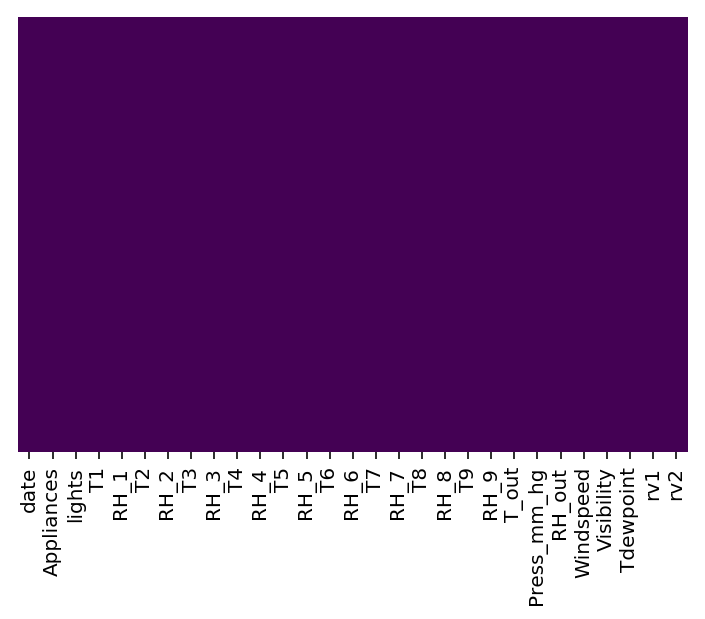

In [8]:
sns.heatmap(energy_data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

# Data Pre-processing

In [38]:
energy_data['date'] = pd.to_datetime(energy_data.date)
energy_data['year'] = energy_data.date.dt.year
energy_data['month'] = energy_data.date.dt.month
energy_data['day'] = energy_data.date.dt.day
energy_data['hours'] = energy_data.date.dt.hour
energy_data['minutes'] = energy_data.date.dt.minute
energy_data['seconds'] = energy_data.date.dt.second
energy_data['week'] = energy_data.date.dt.week
energy_data['day_name'] = energy_data.date.dt.weekday_name
energy_data['day_of_week'] = energy_data.date.dt.dayofweek
energy_data['weekday'] = ((energy_data.date.dt.dayofweek // 5 == 1).astype(int))
 
energy_data.to_csv("energydata_complete_revised.csv", index=False)
energy_data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,year,month,day,hours,minutes,seconds,week,day_name,day_of_week,weekday
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,2016,1,11,17,0,0,2,Monday,0,0
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,2016,1,11,17,10,0,2,Monday,0,0
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,2016,1,11,17,20,0,2,Monday,0,0
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,2016,1,11,17,30,0,2,Monday,0,0
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,2016,1,11,17,40,0,2,Monday,0,0


# Histogram Analysis


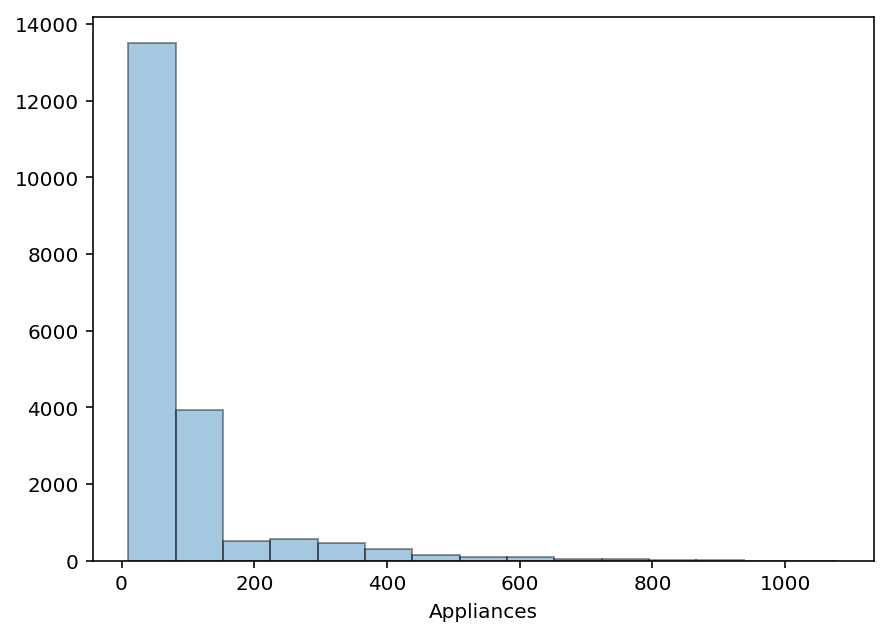

In [10]:
plt.figure(figsize=(7,5))
sns.distplot(energy_data['Appliances'],kde=False,bins=15)

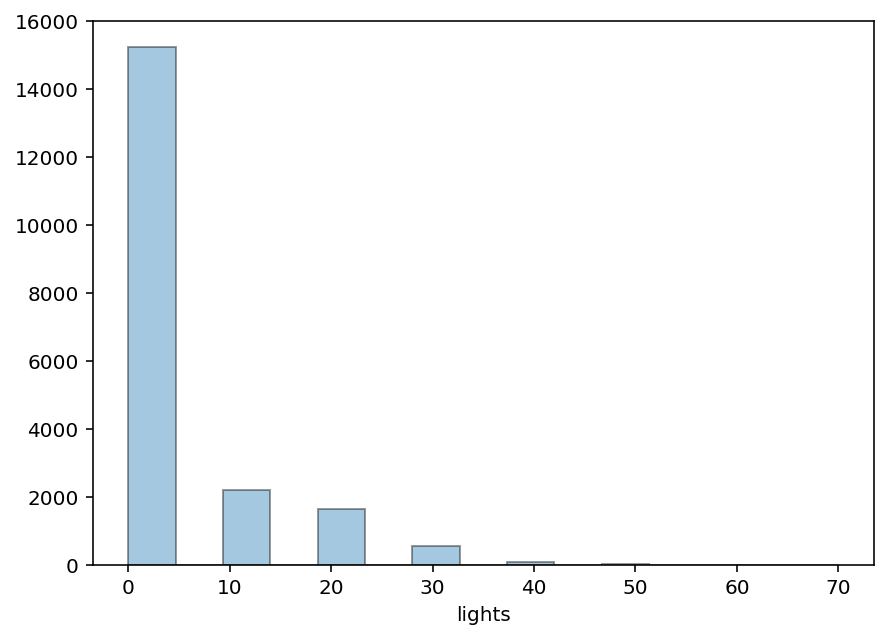

In [11]:
plt.figure(figsize=(7,5))
sns.distplot(energy_data['lights'],kde=False,bins=15)

## Analysis for target variable

In [12]:
labels = ['Appliances','lights']
values = [energy_data['Appliances'].sum(),energy_data['lights'].sum()]
trace = go.Pie(labels=labels, values=values)
py.iplot([trace], filename='basic_pie_chart')

# Energy consumed by appliances in 1st year quater

In [13]:
data = [go.Scatter( x=energy_data['date'], y=energy_data['Appliances'] )]
py.iplot(data, filename='pandas-time-series')

# Energy consumed by lights in 1st year quater

In [14]:
data = [go.Scatter( x=energy_data['date'], y=energy_data['lights'] )]
py.iplot(data, filename='pandas-time-series')

## Conlusion
Energy consumption from Appliances: 96.3%
Energy consumption from lights:     3.75%

Therefore, focusing on target variable --> Appliance

# Correlation between Appliances and Dependent variables

In [15]:
sns.set_palette("GnBu_d")
sns.set_style('whitegrid')

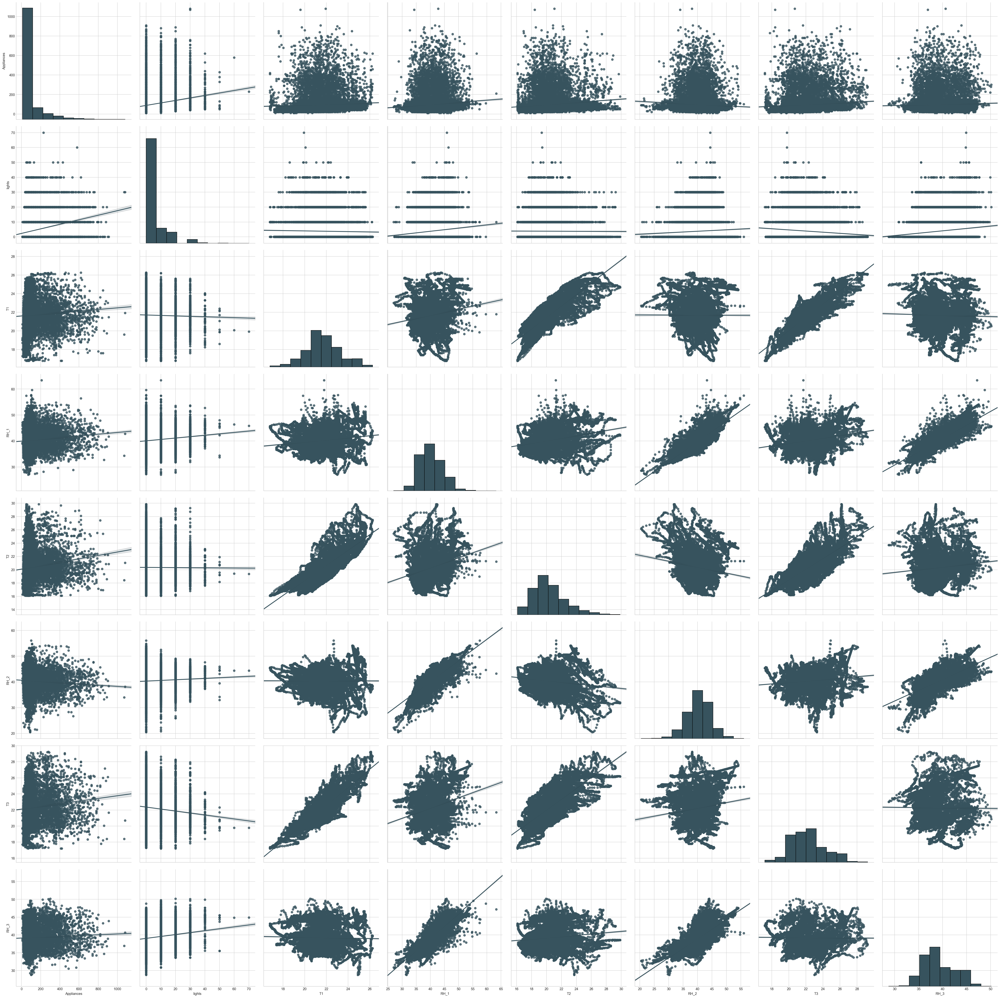

In [16]:
pairplot1 = sns.pairplot(energy_data, vars=["Appliances", "lights", "T1", "RH_1", "T2", "RH_2", "T3", "RH_3"], kind='reg', size= 5)

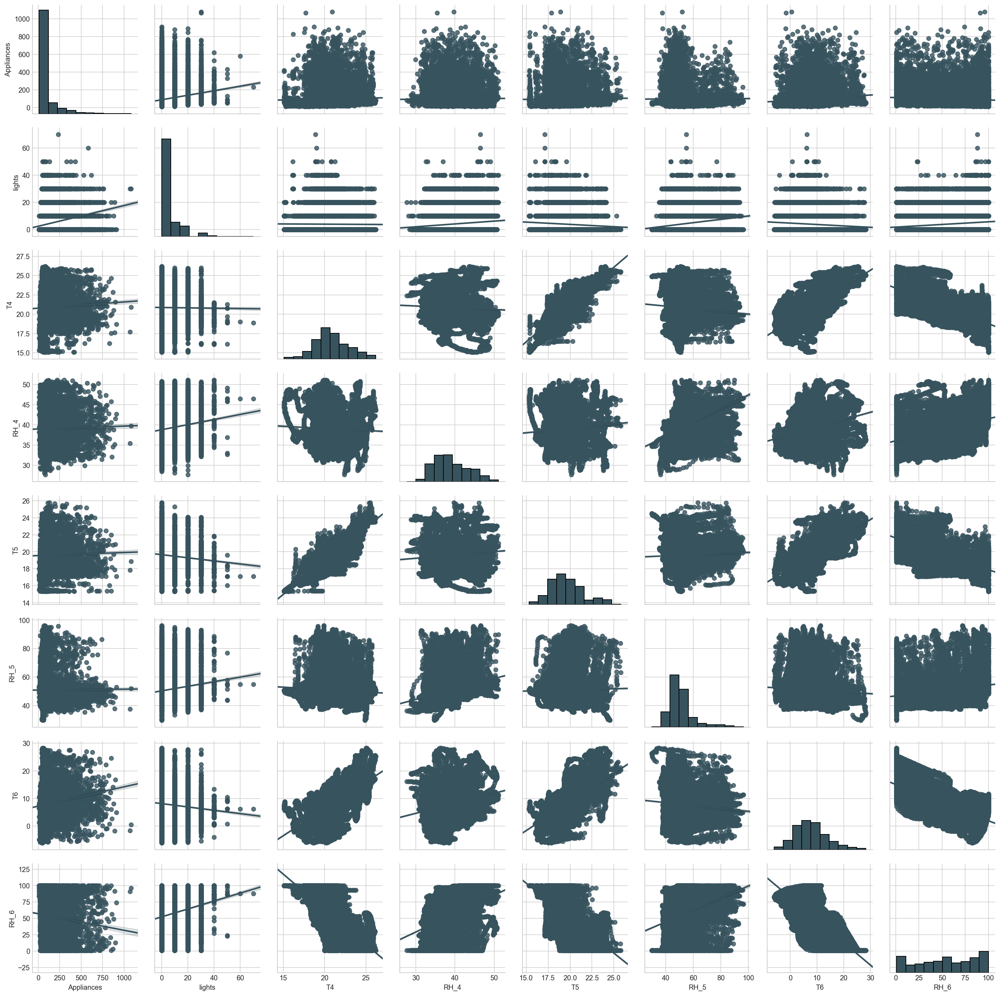

In [64]:
pairplot2 = sns.pairplot(energy_data, vars=["Appliances", "lights", "T4", "RH_4", "T5", "RH_5", "T6", "RH_6"], kind='reg', size= 5)

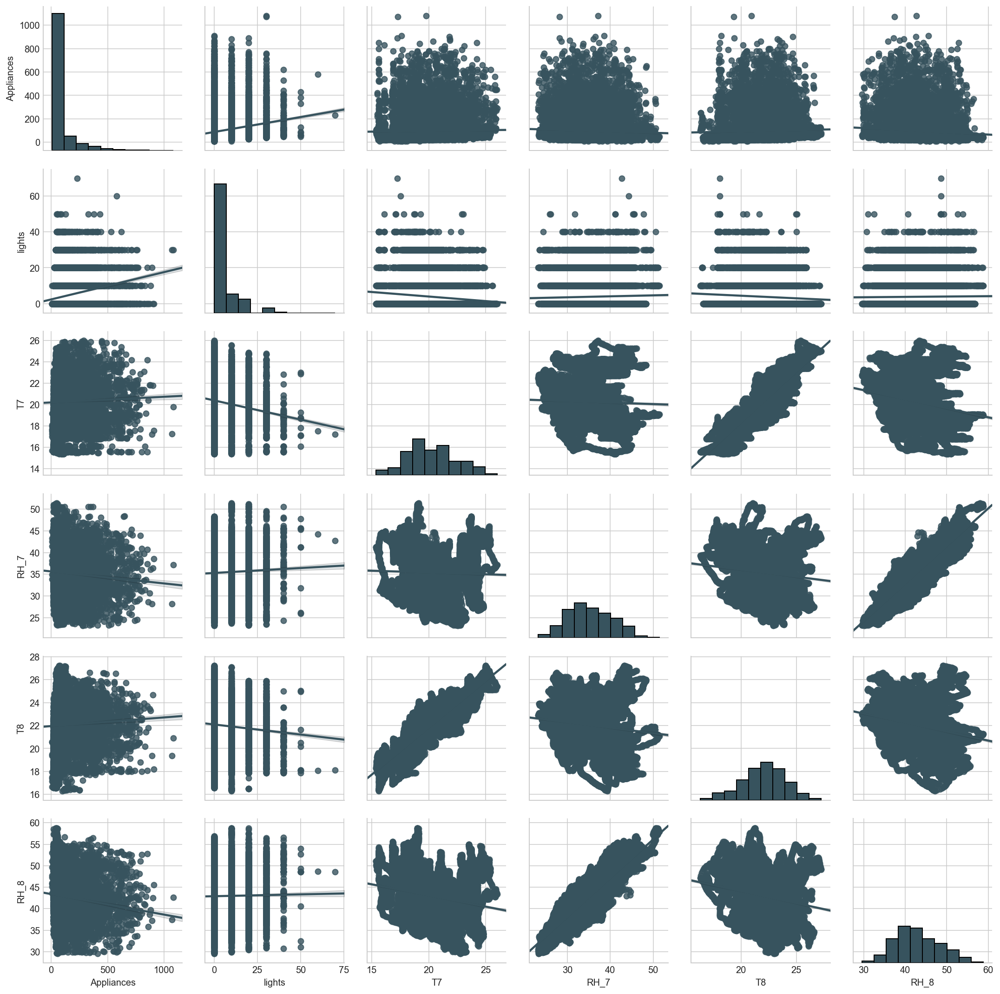

In [66]:
pairplot3 = sns.pairplot(energy_data, vars=["Appliances", "lights", "T7", "RH_7", "T8","RH_8"], kind='reg', size= 5)

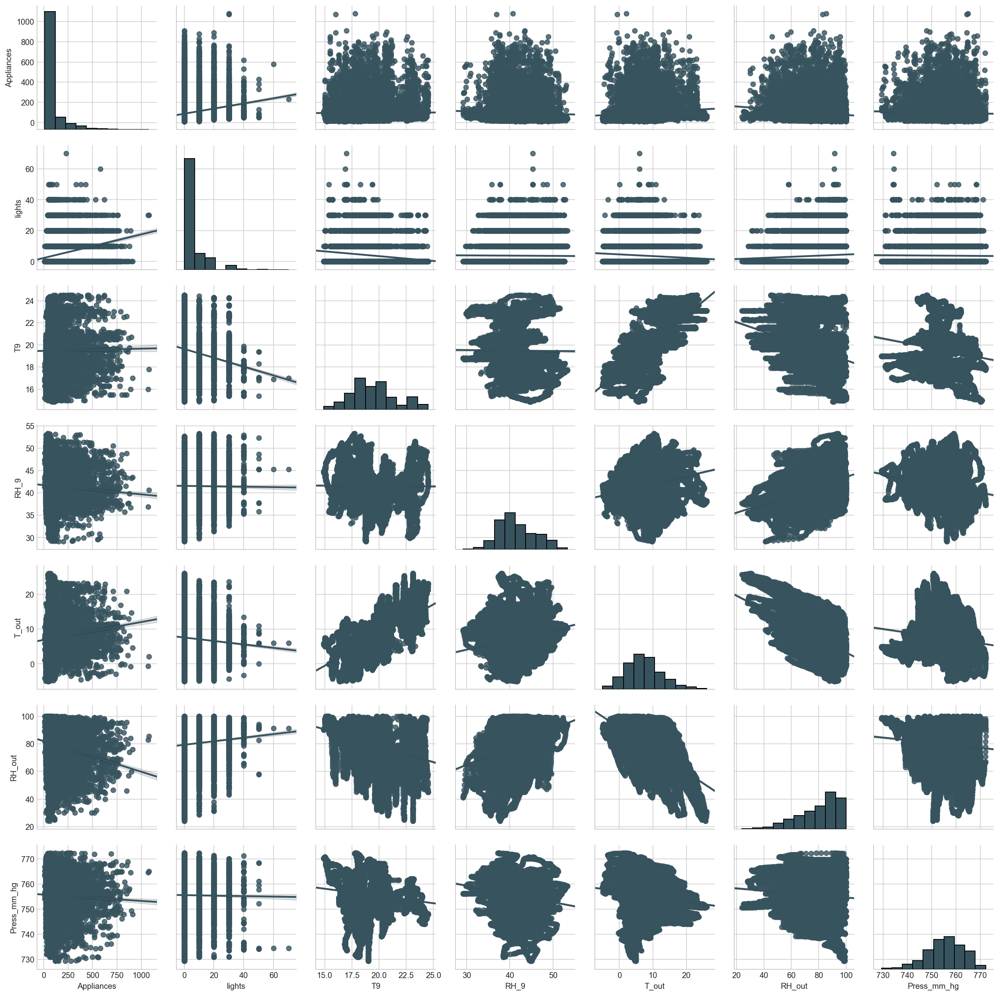

In [69]:
pairplot4 = sns.pairplot(energy_data, vars=["Appliances", "lights", "T9", "RH_9", "T_out", "RH_out", "Press_mm_hg"], kind="reg", size= 5)

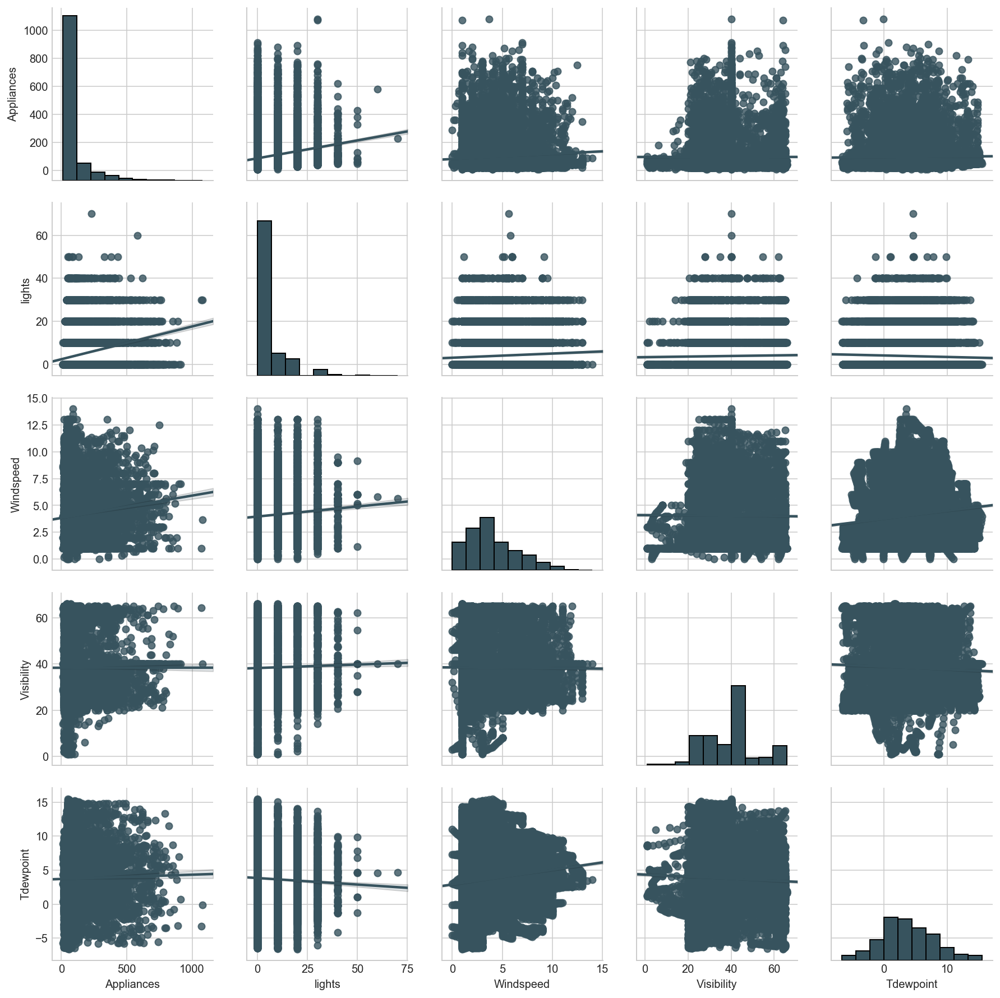

In [70]:
pairplot5 = sns.pairplot(energy_data, vars=["Appliances", "lights", "Windspeed", "Visibility", "Tdewpoint"], kind='reg', size= 5)

# Analyzing energy used by appliances over different time distribution

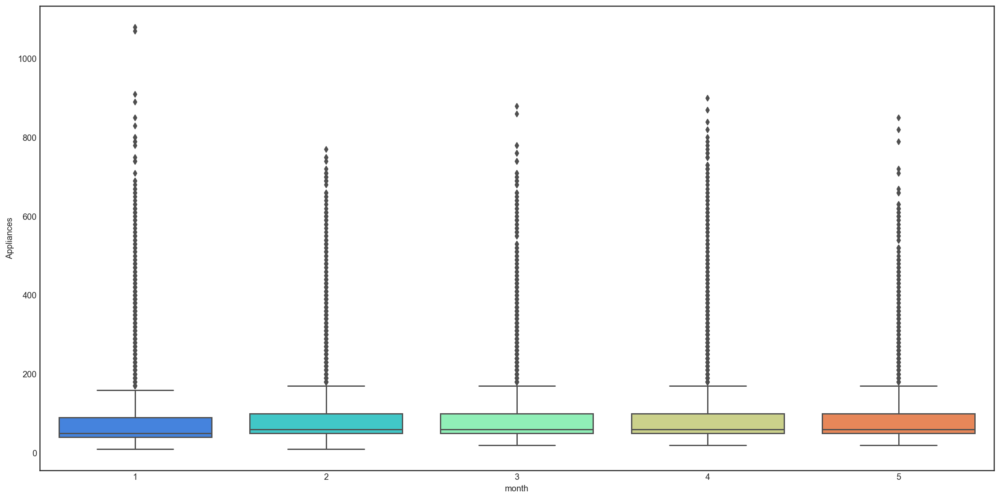

In [42]:
fig = plt.figure(1, figsize=(20, 10))
sns.set_style('white')
ax = sns.boxplot(x="month", y="Appliances", data=energy_data, palette='rainbow')

In [121]:
energy_data[energy_data['month'] == 1]
# sns.set_palette("GnBu_d")
# sns.set_style('white')
# sns.barplot(x=["Jan", "Feb", "Mar", "April", "May"], y="Appliances", data=monthVsApp)
#monthVsApp.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,year,month,day,hours,minutes,seconds,week,day_name,weekday,day_of_week
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,...,2016,1,11,17,0,0,2,Monday,0,0
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,...,2016,1,11,17,10,0,2,Monday,0,0
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,...,2016,1,11,17,20,0,2,Monday,0,0
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,...,2016,1,11,17,30,0,2,Monday,0,0
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,...,2016,1,11,17,40,0,2,Monday,0,0
5,2016-01-11 17:50:00,50,40,19.890000,46.026667,19.200000,44.500000,19.790000,44.933333,18.890000,...,2016,1,11,17,50,0,2,Monday,0,0
6,2016-01-11 18:00:00,60,50,19.890000,45.766667,19.200000,44.500000,19.790000,44.900000,18.890000,...,2016,1,11,18,0,0,2,Monday,0,0
7,2016-01-11 18:10:00,60,50,19.856667,45.560000,19.200000,44.500000,19.730000,44.900000,18.890000,...,2016,1,11,18,10,0,2,Monday,0,0
8,2016-01-11 18:20:00,60,40,19.790000,45.597500,19.200000,44.433333,19.730000,44.790000,18.890000,...,2016,1,11,18,20,0,2,Monday,0,0
9,2016-01-11 18:30:00,70,40,19.856667,46.090000,19.230000,44.400000,19.790000,44.863333,18.890000,...,2016,1,11,18,30,0,2,Monday,0,0


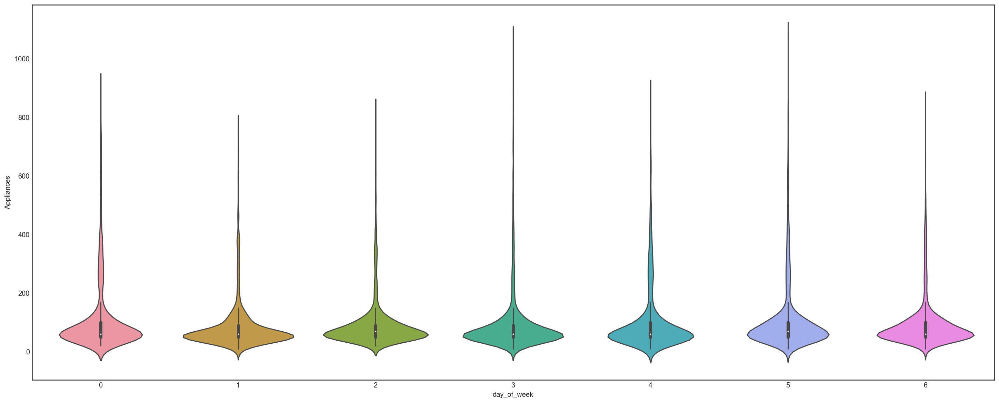

In [44]:
fig = plt.figure(1, figsize=(25, 10))
sns.set_style('white')
ax1 = sns.violinplot(x="day_of_week", y="Appliances", data=energy_data)

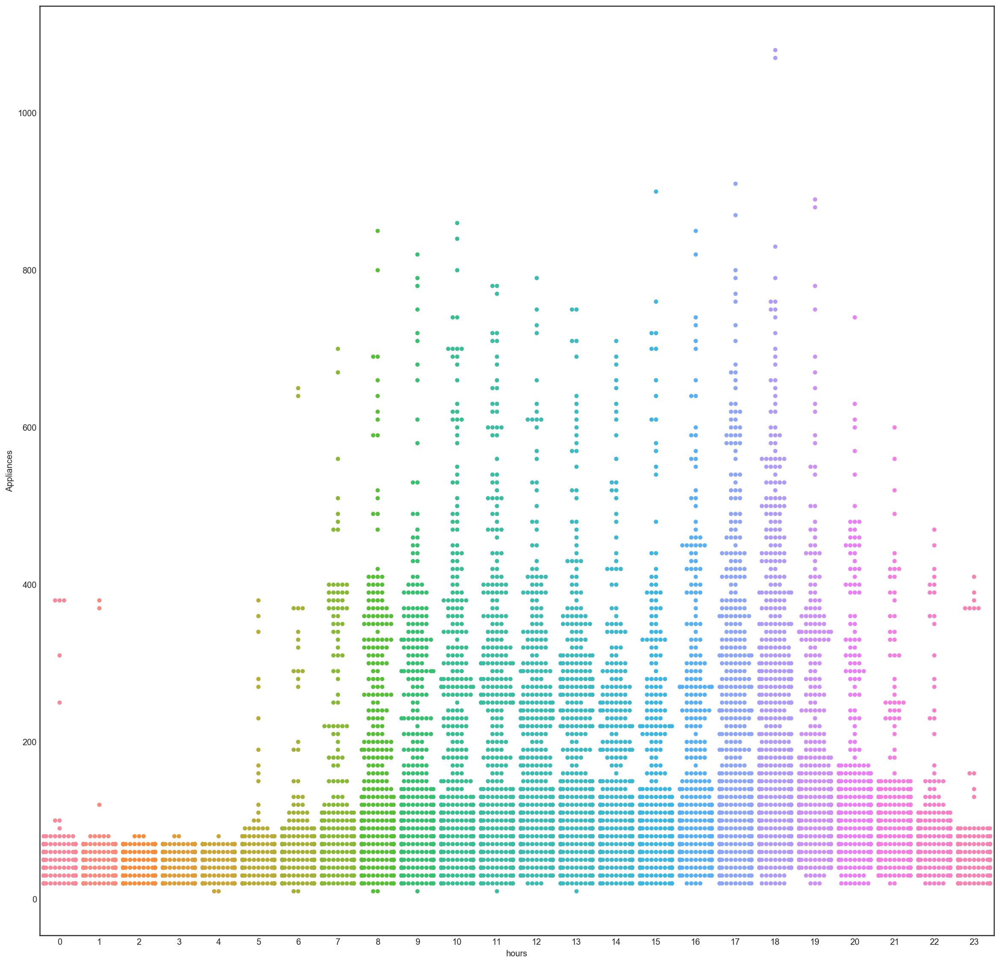

In [111]:
plt.figure(1, figsize=(20, 20))
sns.set_style('white')
ax1 = sns.swarmplot(x="hours", y="Appliances", data=energy_data)

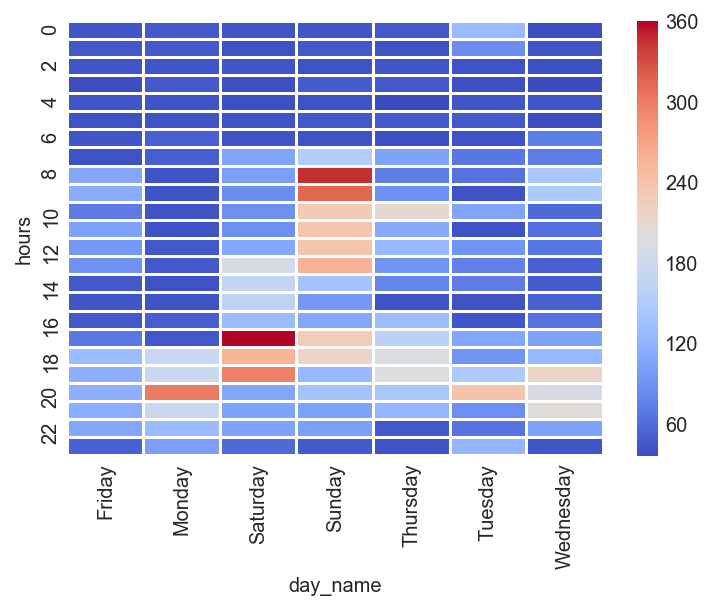

In [57]:
month1 = energy_data[energy_data['month'] == 1]
month1_pivot =month1.pivot_table(index='hours', columns='day_name', values='Appliances')
sns.heatmap(month1_pivot, linecolor='white', linewidths=1, cmap='coolwarm')

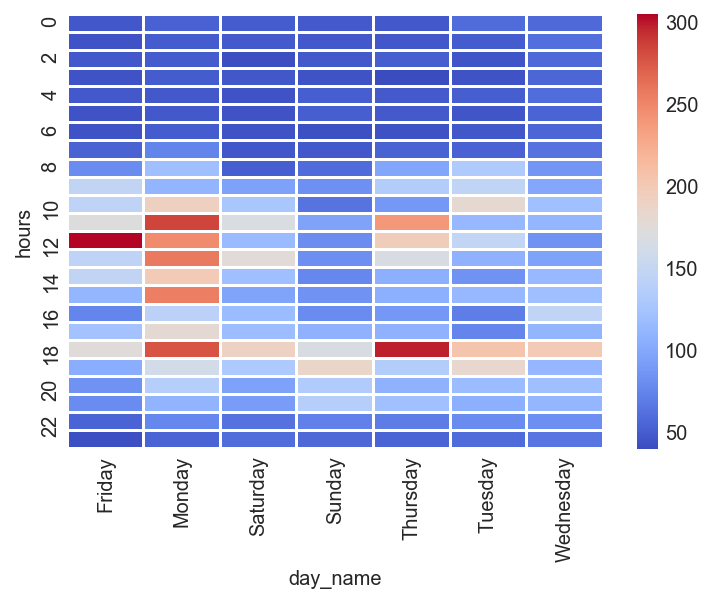

In [143]:
month1 = energy_data[energy_data['month'] == 2]
month1_pivot =month1.pivot_table(index='hours', columns='day_name', values='Appliances')
sns.heatmap(month1_pivot, linecolor='white', linewidths=1, cmap='coolwarm')

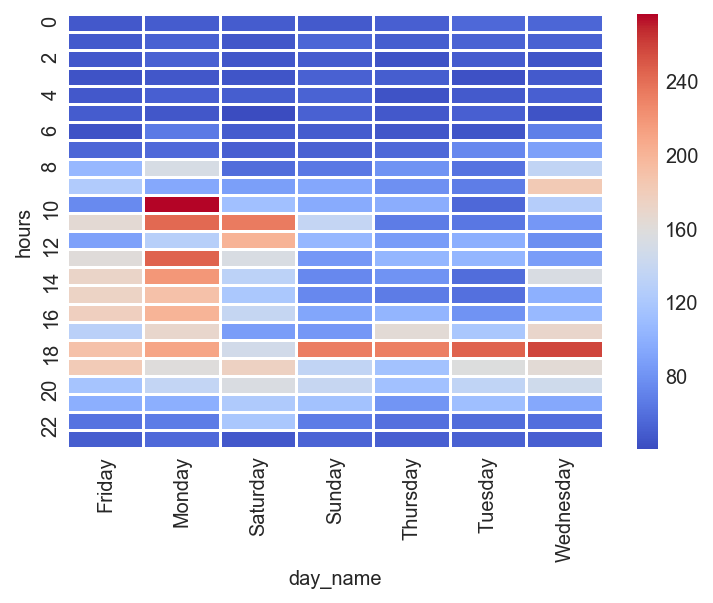

In [144]:
month1 = energy_data[energy_data['month'] == 3]
month1_pivot =month1.pivot_table(index='hours', columns='day_name', values='Appliances')
sns.heatmap(month1_pivot, linecolor='white', linewidths=1, cmap='coolwarm')

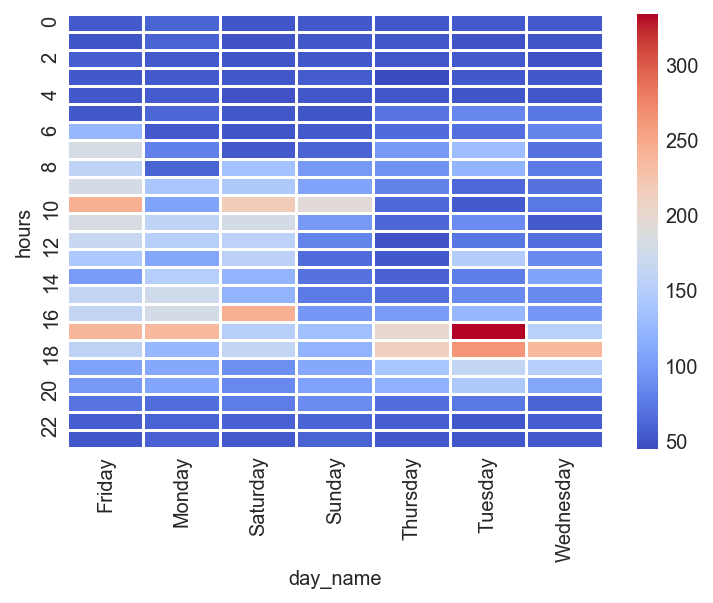

In [145]:
month1 = energy_data[energy_data['month'] == 4]
month1_pivot =month1.pivot_table(index='hours', columns='day_name', values='Appliances')
sns.heatmap(month1_pivot, linecolor='white', linewidths=1, cmap='coolwarm')

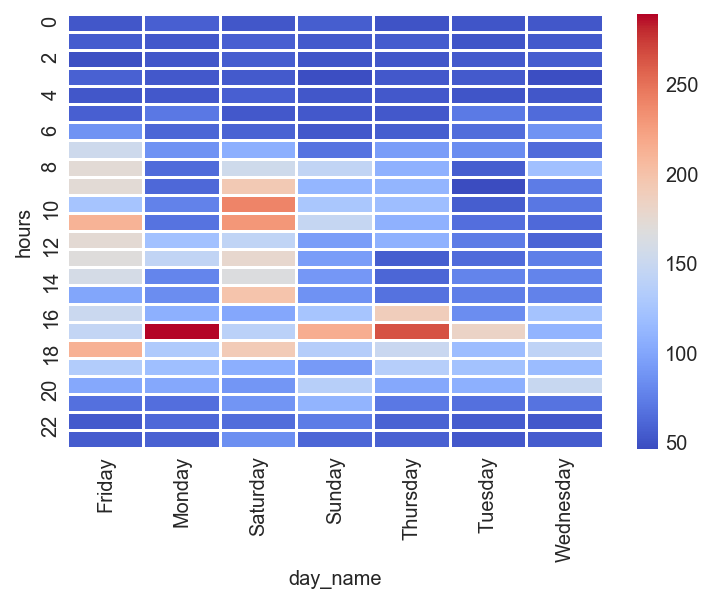

In [146]:
month1 = energy_data[energy_data['month'] == 5]
month1_pivot =month1.pivot_table(index='hours', columns='day_name', values='Appliances')
sns.heatmap(month1_pivot, linecolor='white', linewidths=1, cmap='coolwarm')

In [155]:
energy_data.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2', 'year', 'month', 'day',
       'hours', 'minutes', 'seconds', 'week', 'day_name', 'weekday',
       'day_of_week'],
      dtype='object')

# Correlation Matrix



In [148]:
corr_data = energy_data.drop(['year', 'seconds'], axis=1)
corr_data = corr_data.corr()
corr_data.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Tdewpoint,rv1,rv2,month,day,hours,minutes,week,weekday,day_of_week
Appliances,1.000000,0.197278,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,...,0.015353,-0.011145,-0.011145,-0.011606,0.002366,0.216792,0.013216,-0.011356,0.017437,0.003060
lights,0.197278,1.000000,-0.023528,0.106968,-0.005622,0.050985,-0.097393,0.131161,-0.008859,0.114936,...,-0.036322,0.000521,0.000521,-0.179452,-0.041895,0.255346,-0.003348,-0.186486,-0.051404,-0.099828
T1,0.055447,-0.023528,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,...,0.571309,-0.006203,-0.006203,0.706305,-0.127088,0.178858,0.000510,0.694857,0.010885,0.001381
RH_1,0.086031,0.106968,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,...,0.639106,-0.000699,-0.000699,-0.094048,-0.041397,0.018594,-0.001172,-0.100089,-0.018641,-0.053782
T2,0.120073,-0.005622,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,...,0.582602,-0.011087,-0.011087,0.533479,-0.156913,0.254784,-0.000027,0.512884,-0.005065,0.000602


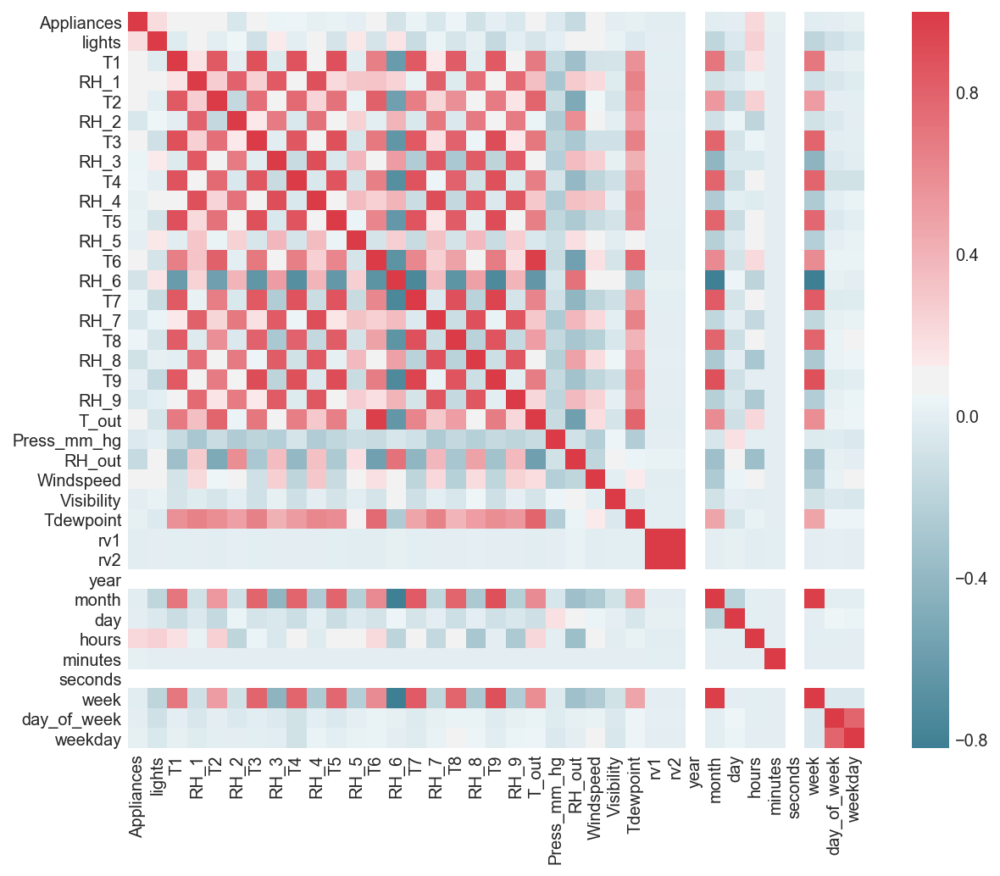

In [19]:
f, ax = plt.subplots(figsize=(10, 8))
corr = energy_data.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

In [13]:
# sns.heatmap(corr, 
#         xticklabels=corr.columns,
#         yticklabels=corr.columns)
cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

/Applications/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning:

invalid value encountered in less



In [53]:
def conditional_bar(series, bar_colors=None, color_labels=None, figsize=(13,6),
                   xlabel=None, by=None, ylabel=None, title=None):
    fig, ax  = plt.subplots(figsize=figsize)
    if not bar_colors:
        bar_colors = mpl.rcParams['axes.prop_cycle'].by_key()['color'][0]
    plt.barh(range(len(series)),series.values, color=bar_colors)
    plt.xlabel('' if not xlabel else xlabel);
    plt.ylabel('' if not ylabel else ylabel)
    plt.yticks(range(len(series)), series.index.tolist())
    plt.title('' if not title else title);
    plt.ylim([-1,len(series)]);
    if color_labels:
        for col, lab in color_labels.items():
            plt.plot([], linestyle='',marker='s',c=col, label= lab);
        lines, labels = ax.get_legend_handles_labels();
        ax.legend(lines[-len(color_labels.keys()):], labels[-len(color_labels.keys()):], loc='upper right');
    plt.close()
    return fig

In [54]:
recent_corr = energy_data.corr().loc['Appliances'].drop(['Appliances', 'year', 'seconds', 'lights'])    

## Selecting variables with correlation greater than 0.05


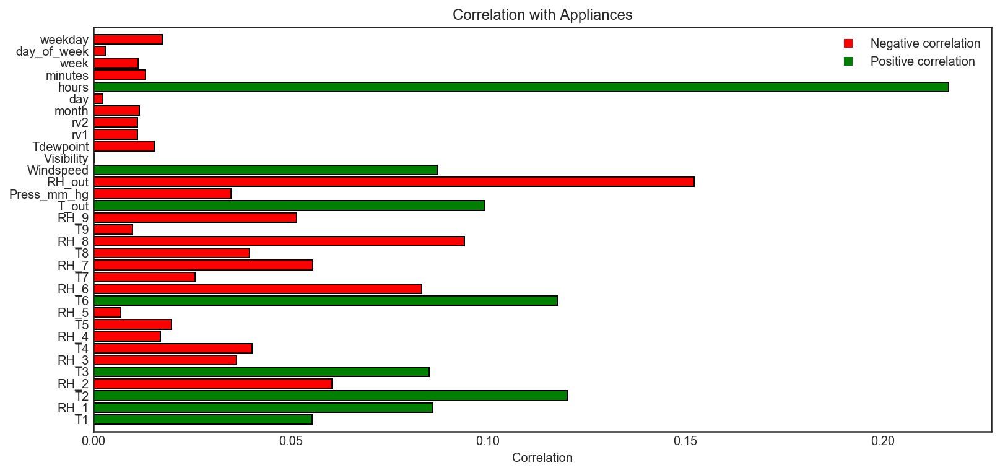

In [56]:
bar_colors = ['red' if x else 'green' for x in list(recent_corr.values < 0.05)]
color_labels = {'red':'Negative correlation', 'green':'Positive correlation'}

conditional_bar(recent_corr.apply(np.abs), bar_colors, color_labels,
               title='Correlation with Appliances',
               xlabel='Correlation')

## Considering multicollinearity problem

Selected variables: 'hours','T1','RH_1','RH_5','RH_6','RH_8','T_out','Windspeed','Visibility','Tdewpoint'

In [161]:
pandas_profiling.ProfileReport(energy_data)

Number of variables,39
Number of observations,19735
Total Missing (%),0.0%
Total size in memory,5.9 MiB
Average record size in memory,312.0 B
Numeric,31
Categorical,1
Date,1
Text (Unique),0
Rejected,6
Distinct count,92
